In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
start_period = "01/09/2003"
end_period = "31/08/2018"

In [3]:
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))
flow_sar_ons = Flow(data=flow_ons.data.combine_first(flow_sar.data["D19086"].to_frame()))

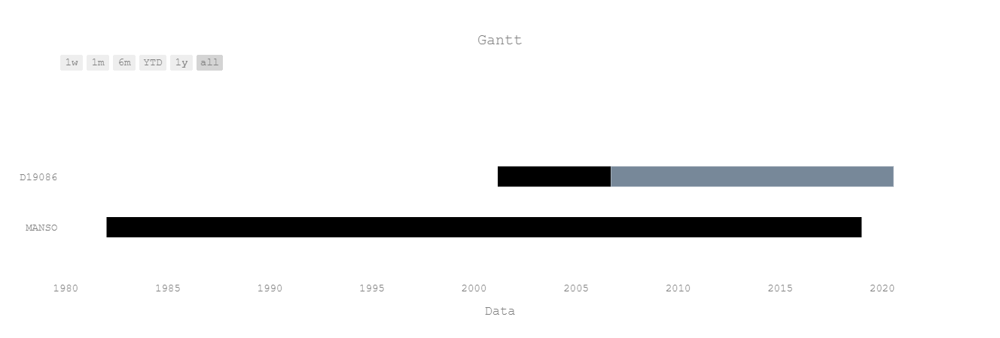

In [4]:
fig_gantt, data_gantt = flow_sar_ons.gantt("Gantt")
py.offline.iplot(fig_gantt)

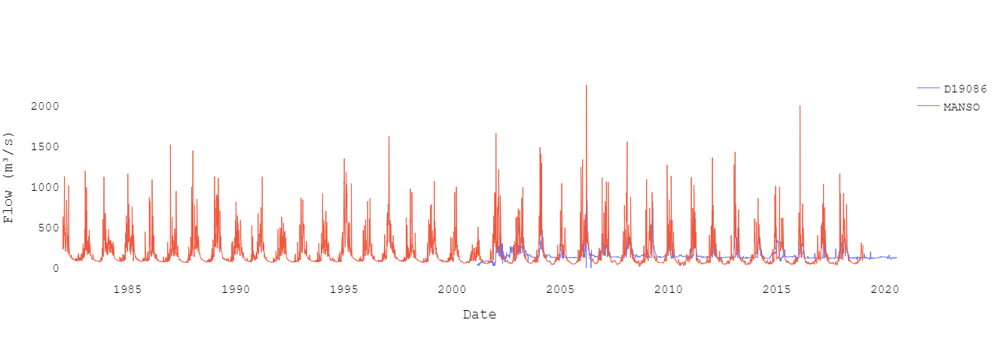

In [5]:
fig_hidro, data_hidro = flow_sar_ons.hydrogram("")
py.offline.iplot(fig_hidro)

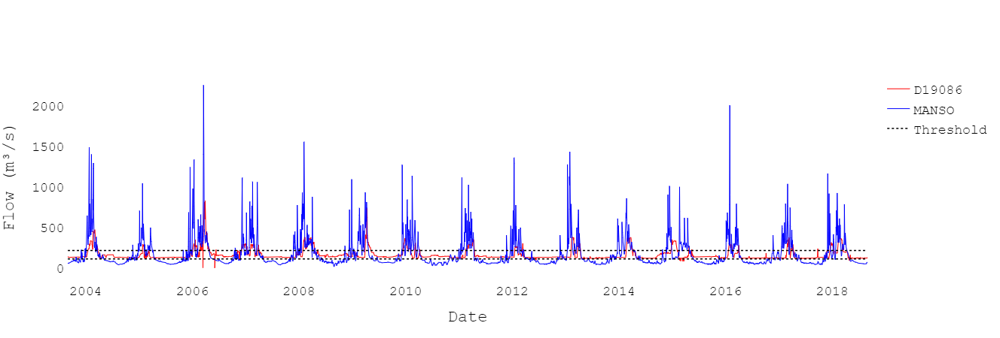

In [6]:
start_period = "01/09/2003"
end_period = "31/08/2018"
flow_sar_ons.date(date_start=start_period, date_end=end_period)
threshold_high = flow_ons.quantile(0.75)[0]
threshold_low = flow_ons.quantile(0.50)[0]
fig_start_filling_hydro, data_start_filling_hydro = flow_sar_ons.hydrogram("", color={"MANSO": "#0000FF", "D19086": "#FF0000"}, threshold=[threshold_high, threshold_low], size_text=18)
fig_start_filling_hydro["data"][2]["name"] = "Threshold"
fig_start_filling_hydro["data"][3]["showlegend"] = False
py.offline.iplot(fig_start_filling_hydro)

In [7]:
# fig_hidro = go.Figure(fig_start_filling_hydro)
# fig_hidro.write_image("hidro_manso_sar.png", width=1400, height=800)

In [8]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))

In [9]:
nulls = flow_sar.data["D19086"].isnull()
date_start = flow_sar.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow_sar.data.loc[nulls].index[-1]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date] + delta
    delta = flow_sar.data["D19086"][date] - flow_ana.data["66231000"][date]

In [10]:
zeros = flow_sar.data.loc[flow_sar.data["D19086"]==0].index

for date in zeros:
    flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date]

Variables:

Magnitude:
- 1-day maximum
- 1-day minimum

Duration:
- High pulse duration
- Low pulse duration

Frequency:
- High pulse count
- Low pulse count

Timing:
- Date of maximum
- Date of minimum

# Control x Impact

In [11]:
start_period = "01/09/2003"
end_period = "31/08/2018"
flow_pre = Flow(data=flow_ons.data)
flow_pre = flow_pre.date(date_start=start_period, date_end=end_period)

In [12]:
flow_ons_thres = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [13]:
 # q90
threshold_high = flow_ons_thres.quantile(0.75)[0]
f"Threshold high: {threshold_high}"

'Threshold high: 213.0'

In [14]:
# q50
threshold_low = flow_ons_thres.quantile(0.50)[0]
f"Threshold low: {threshold_low}"

'Threshold low: 109.0'

## Manso

In [15]:
iha_pre = flow_pre.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [16]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,171.199142,652.947127
1-day minimum,10.405677,78.664631
High events count,2.250926,6.266667
Low events count,2.350279,6.333333
High events duration,5.443449,15.443199
Low events duration,25.852296,35.345904
Date of maximum,52.787405,141.140101
Date of minimum,43.464891,237.203814


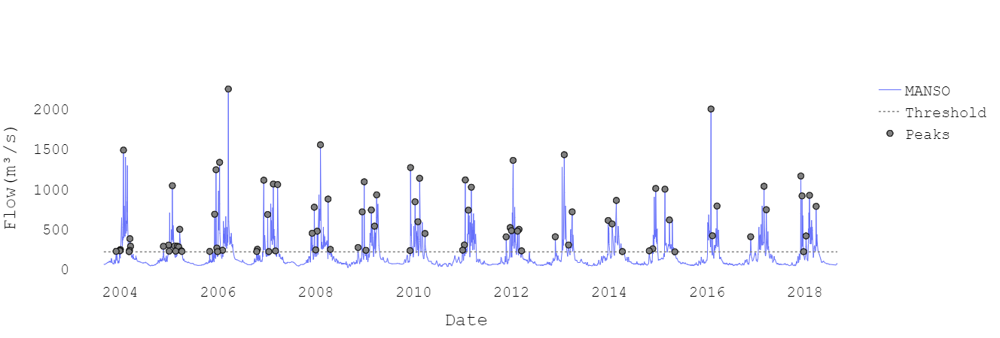

In [60]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_high)

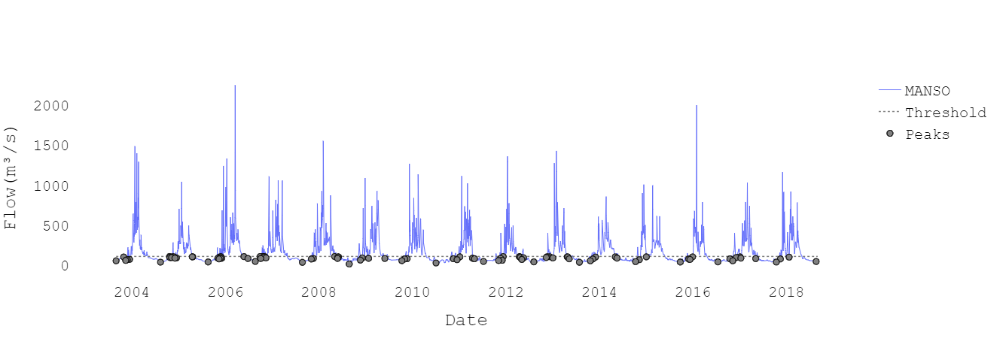

In [61]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_low)

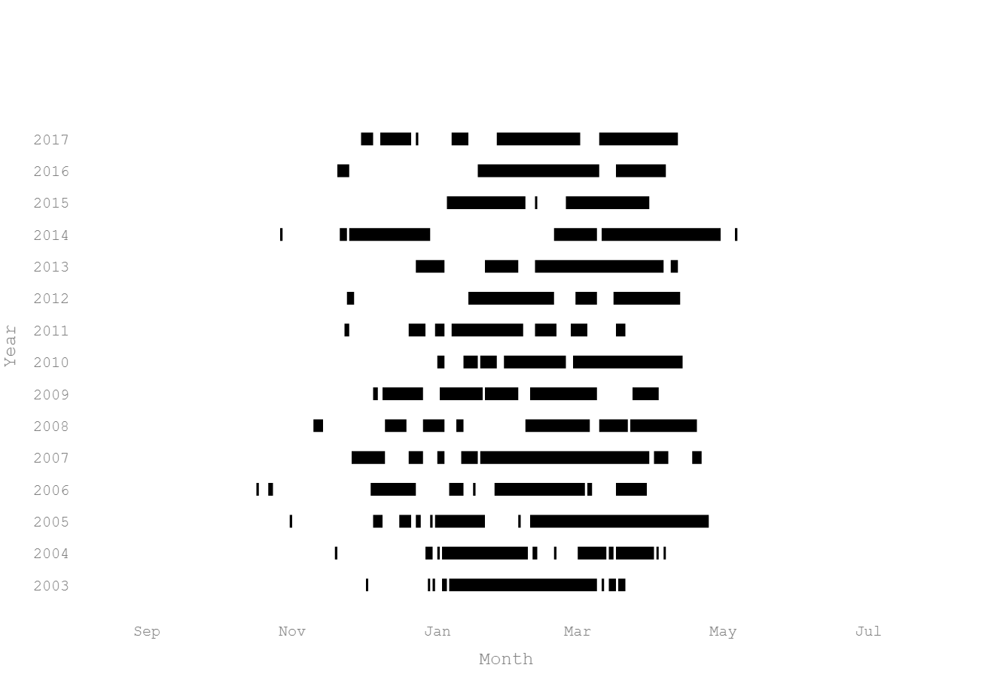

In [62]:
fig_events_high_spells, data_events_high_spells = iha_pre.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_high_spells)

In [63]:
# fig_spells_nat_high = go.Figure(fig_events_high_spells)
# fig_spells_nat_high.write_image("fig_spells_ons_high.png", width=1400, height=1000)

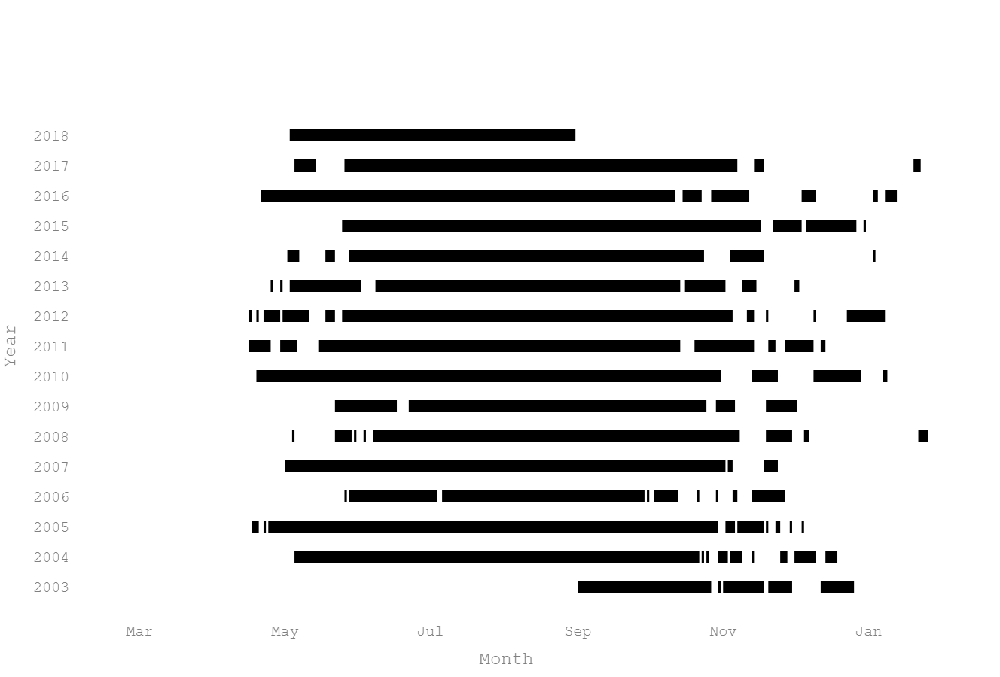

In [64]:
fig_events_low_spells, data_events_low_spells = iha_pre.events_low.plot_spells("", size_text=20)
py.offline.iplot(fig_events_low_spells)

In [65]:
# fig_spells_ons_low = go.Figure(fig_events_low_spells)
# fig_spells_ons_low.write_image("fig_spells_ons_low.png", width=1400, height=1000)

# Observado

In [23]:
flow_obs = Flow(data=flow_sar.data["D19086"].to_frame())
flow_obs.date(date_start=start_period, date_end=end_period)

In [24]:
iha_pos = flow_obs.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [25]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,122.986882,344.221511
1-day minimum,9.087079,96.750000
High events count,2.263583,2.866667
Low events count,1.055597,0.600000
High events duration,18.471687,24.893333
Low events duration,0.836660,1.500000
Date of maximum,53.656166,97.562222
Date of minimum,111.346307,195.000000


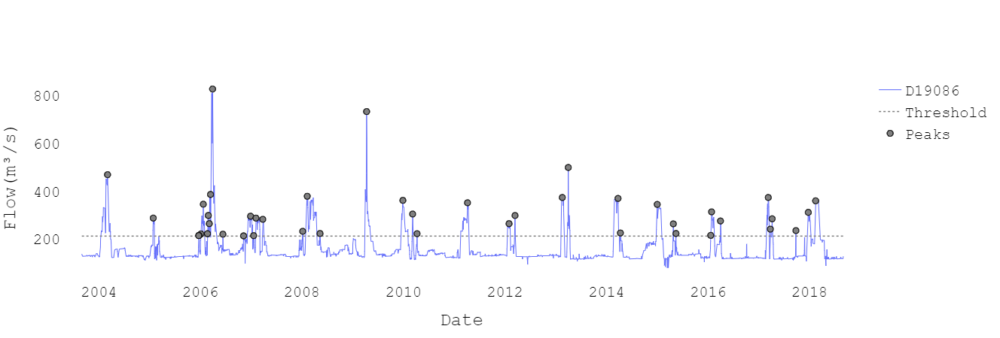

In [66]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_high_pos)

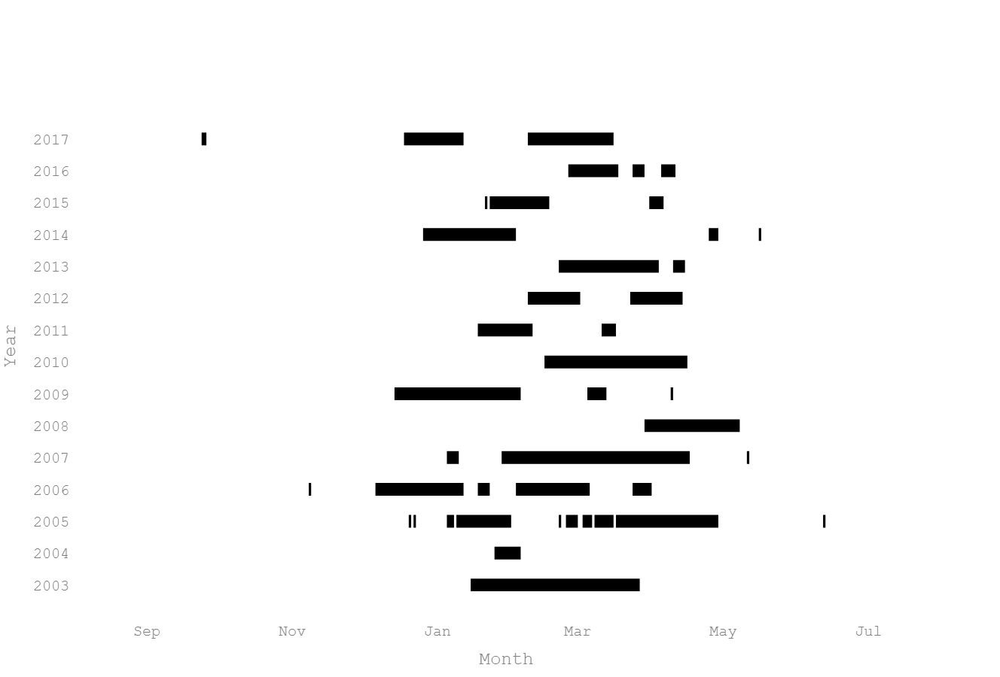

In [67]:
fig_events_high_spells_pos, data_events_high_spells_pos = iha_pos.events_high.plot_spells("", size_text=20)
py.offline.iplot(fig_events_high_spells_pos)

In [68]:
# fig_spells_sar_high = go.Figure(fig_events_high_spells_pos)
# fig_spells_sar_high.write_image("fig_spells_sar_high.png", width=1400, height=1000)

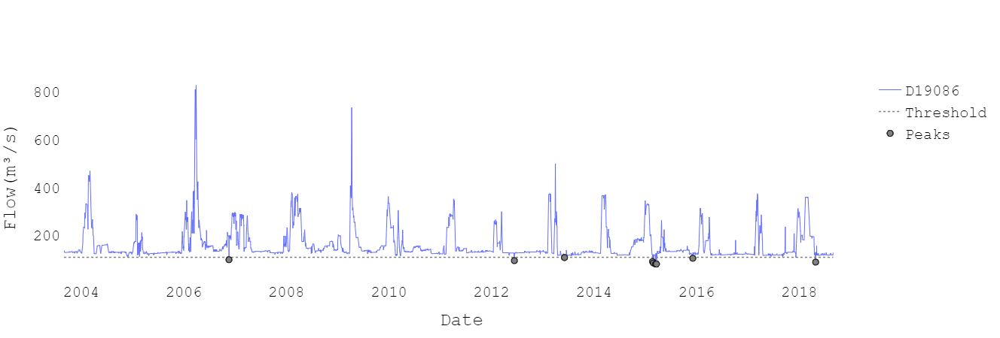

In [69]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram(title="", point_start_end=False, size_text=20)
py.offline.iplot(fig_events_low_pos)

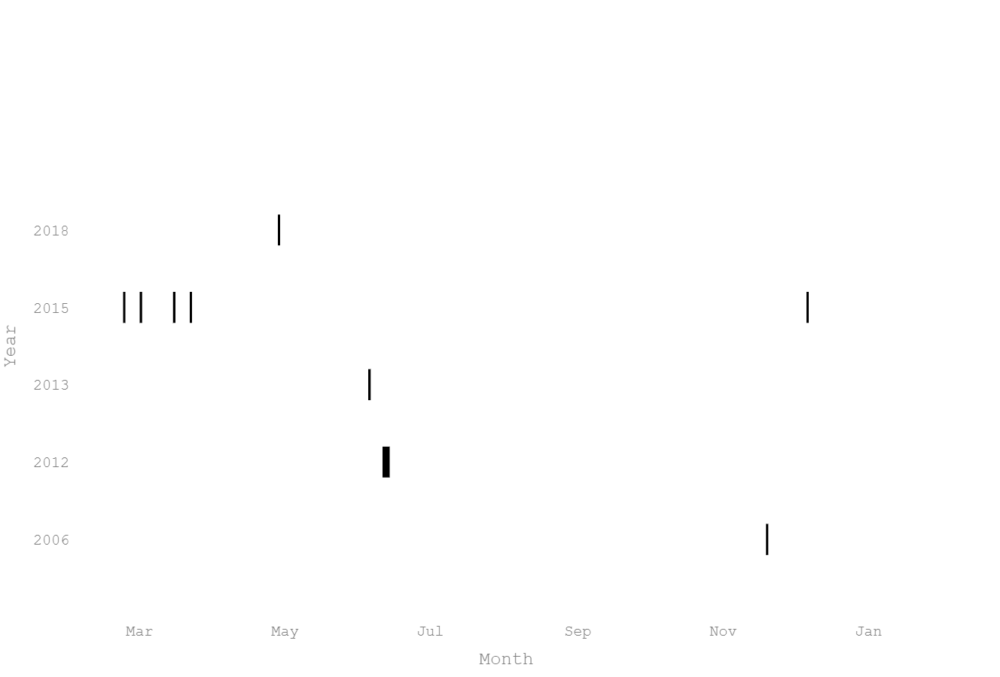

In [70]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.events_low.plot_spells("", size_text=20)
py.offline.iplot(fig_events_low_spells_pos)

In [71]:
# fig_spells_sar_low = go.Figure(fig_events_low_spells_pos)
# fig_spells_sar_low.write_image("fig_spells_sar_low.png", width=1400, height=1000)

In [32]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.events_high.plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.events_high.plot_polar(title="Events High", color="#00008B")

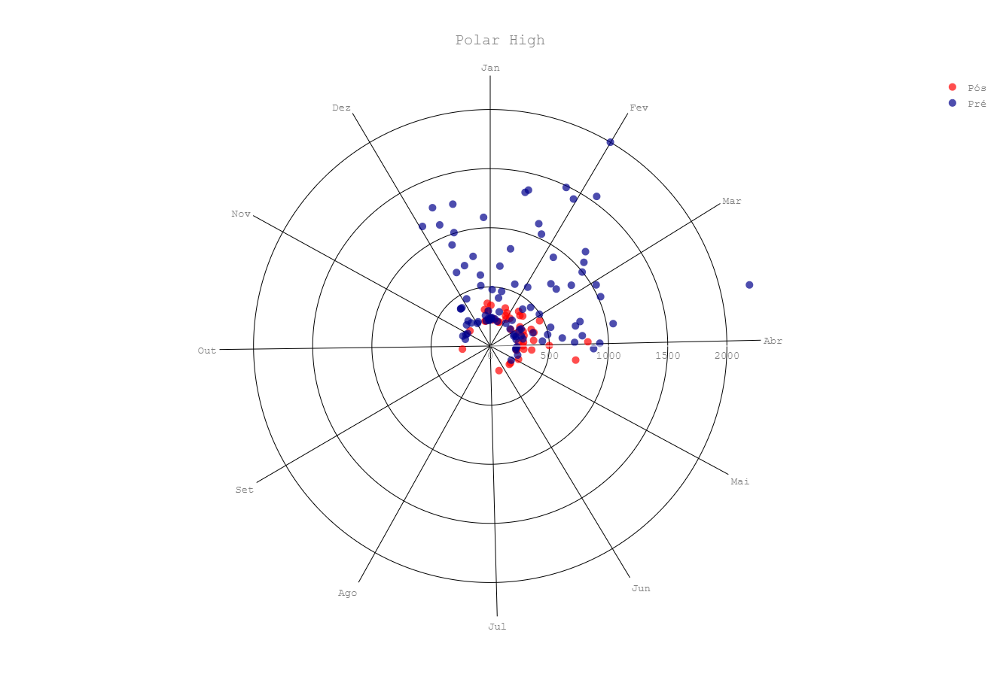

In [33]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

In [55]:
# fig_polar_high = go.Figure(data_polar_pos_high)
# fig_polar_high.write_image("fig_polar_high.png", width=1400, height=1000)

In [35]:
names = {"1-day maximum": "1-day", "Date of maximum": "Date", "High events count": "Count", "High events duration": "Duration", "1-day minimum": "1-day", "Date of minimum": "Date",
         "Low events count": "Count", "Low events duration": "Duration"}

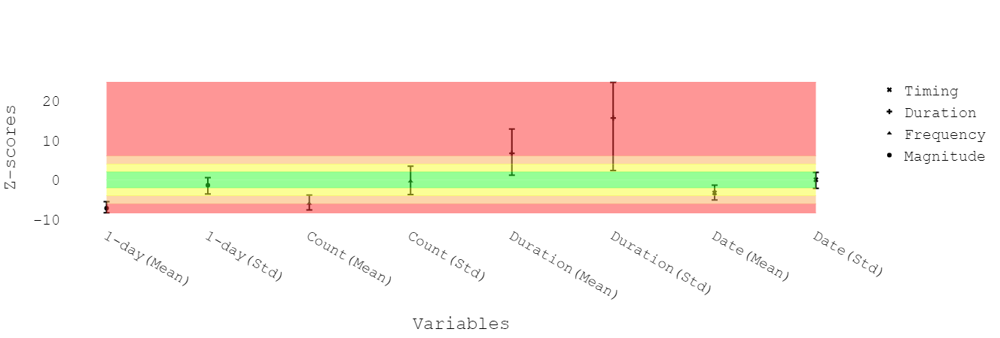

In [72]:
era = iha_pre.era(iha_obs=iha_pos, m=1000)
fig_high, data_high = era.plot(by_type_events="High", size_text=20, showlegend=True, names_variables=names)
py.offline.iplot(fig_high)

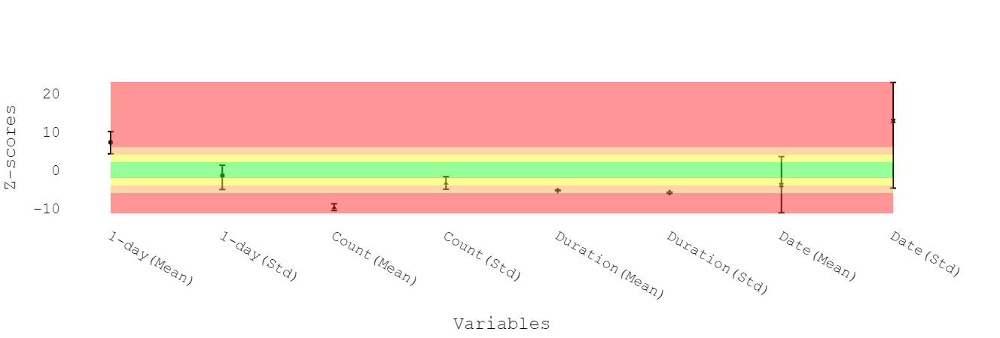

In [73]:
fig_low, data_low = era.plot(by_type_events="Low", showlegend=False, size_text=20, names_variables=names)
py.offline.iplot(fig_low)

In [74]:
# fig_low.write_image("zscore_low_one.png", width=1200, height=800)
# fig_high.write_image("zscore_high_one.png", width=1200, height=800)

In [39]:
era.values_mean()

1-day maximum          -7.151871
1-day minimum           7.213972
Date of maximum        -3.269860
Date of minimum        -3.912593
High events count      -5.960378
High events duration    6.686084
Low events count       -9.834339
Low events duration    -5.332775
Name: Pos - mean, dtype: float64

In [40]:
era.aspects["Magnitude and Duration"].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.987540,2.165994,-8.306161,-5.508481,0.0,-7.151871
1-day minimum,-2.026917,1.931995,4.262800,10.051861,0.0,7.213972


In [41]:
era.aspects["Magnitude and Duration"].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
1-day maximum,-1.955905,1.887627,-3.563229,0.570792,0.0,-1.356447
1-day minimum,-2.137535,1.835513,-5.066486,1.257810,0.0,-1.439571


In [42]:
era.aspects['Frequency and Duration'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-1.960138,1.897711,-7.571556,-3.830611,0.0,-5.960378
Low events count,-1.937624,1.958480,-10.531970,-8.813101,0.0,-9.834339
High events duration,-1.846768,2.086199,1.173464,12.811889,0.0,6.686084
Low events duration,-1.865108,2.035487,-5.411393,-5.214800,0.0,-5.332775


In [43]:
era.aspects['Frequency and Duration'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
High events count,-1.916866,1.923640,-3.714134,3.451491,0.0,-0.348236
Low events count,-2.154435,1.831865,-5.019579,-1.752058,0.0,-3.495462
High events duration,-1.948156,1.958048,2.374818,24.566703,0.0,15.585457
Low events duration,-2.853322,1.557749,-6.042052,-5.758926,0.0,-5.873384


In [44]:
era.aspects['Timing Extreme'].values_mean

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-2.012037,1.856376,-5.075317,-1.346168,0.0,-3.269860
Date of minimum,-1.916046,2.013145,-11.160978,3.518215,0.0,-3.912593


In [45]:
era.aspects['Timing Extreme'].values_std

,Pre - 2_5,Pre - 97_5,Pos - 2_5,Pos - 97_5,Pre - mean,Pos - mean
Date of maximum,-2.030577,1.765795,-2.136864,1.864860,0.0,0.041244
Date of minimum,-2.163816,1.855035,-4.707717,22.888407,0.0,12.796796


In [75]:
# flow_ons_copy = Flow(data=flow_ons.data)
# flow_ons_copy.date(date_start="01/08/2013", date_end="31/07/2016")

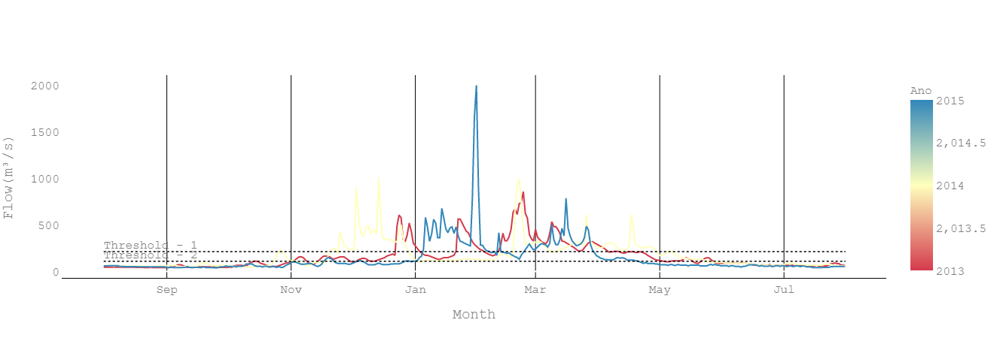

In [76]:
# fig_hydro_year, data_hydro_year = flow_ons_copy.hydrogram_year(title="", threshold=[threshold_high, threshold_low])
# py.offline.iplot(fig_hydro_year)

In [77]:
# fig = go.Figure(fig_hydro_year)
# fig.write_image("hydro_manso.png", width=1200, height=800)